In [1]:
import pandas as pd
import json
from arivale_data_interface import get_snapshot
import warnings
warnings.simplefilter("ignore")

#import the df and the feature indices

sleep_merged = pd.read_csv('../sleep_microbe_metabolite_df/sleep_microbes_metabolites_df.csv')

with open('../sleep_microbe_metabolite_df/activity_features.json', 'r') as f:
    activity_features = json.load(f)
with open('../sleep_microbe_metabolite_df/metabolite_features.json', 'r') as f:
    metabolite_features = json.load(f)
with open('../sleep_microbe_metabolite_df/sleep_features.json', 'r') as f:
    sleep_features = json.load(f)
with open('../sleep_microbe_metabolite_df/microbe_features.json', 'r') as f:
    microbe_features = json.load(f)

In [17]:
# Make binary categorical variable for Adlercreutzia abundance. For binomial test. Must do BEFORE CLR transform below 
# If present (ie abundance greater than 0) then 1
# otherwise if no abundance detected (ie 0), then entry is 0
sleep_merged['adlercreutzia_binary'] = sleep_merged['bacteria_actinobacteria_coriobacteriia_coriobacteriales_coriobacteriaceae_adlercreutzia'].apply(lambda x: 0 if x == 0 else 1)

In [18]:
import scipy
import numpy as np

#centered log ratio transform the microbe columns
#sleep_merged[microbe_features] = sleep_merged[microbe_features].replace(0, 0.0000001)
sleep_merged[microbe_features] = sleep_merged[microbe_features].replace(0, np.nan)
sleep_merged['gmean'] = sleep_merged[microbe_features].apply(scipy.stats.mstats.gmean, axis=1, nan_policy='propagate')
sleep_merged[microbe_features] = np.log(sleep_merged[microbe_features].divide(sleep_merged['gmean'], axis=0))
sleep_merged.drop(columns='gmean', inplace=True)
sleep_merged.reset_index(inplace=True)

#log transform the sleep columns
sleep_merged[sleep_features] = np.log(sleep_merged[sleep_features])

#log transform the activity columns
sleep_merged[activity_features] = np.log(sleep_merged[activity_features])

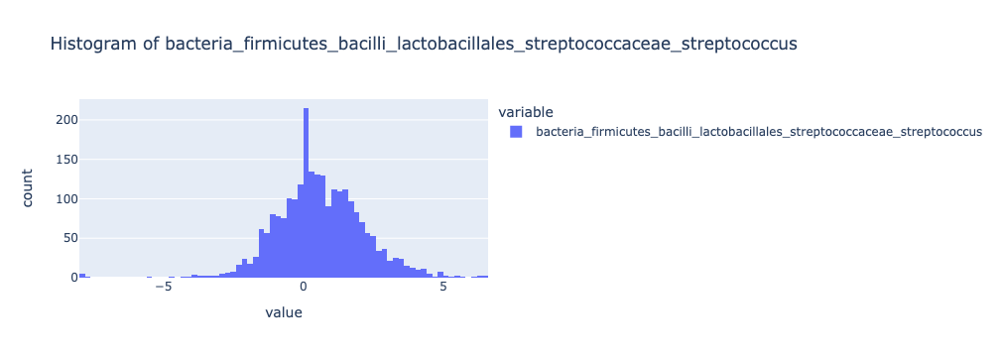

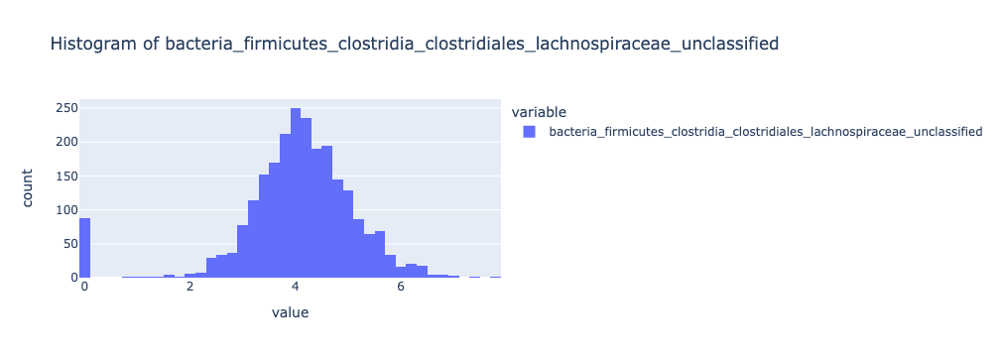

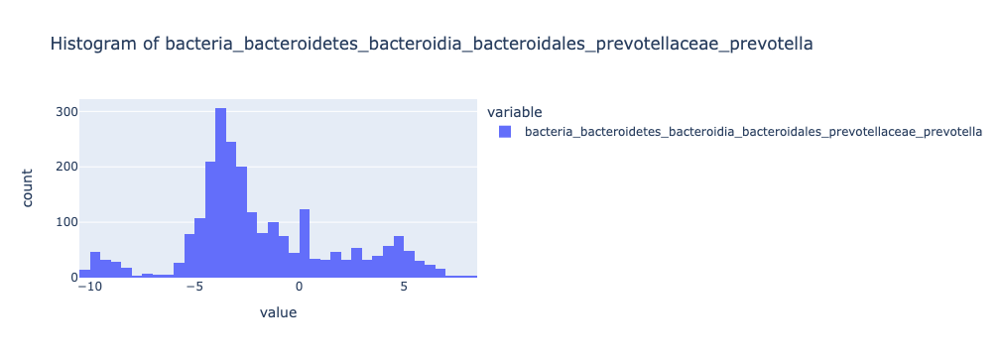

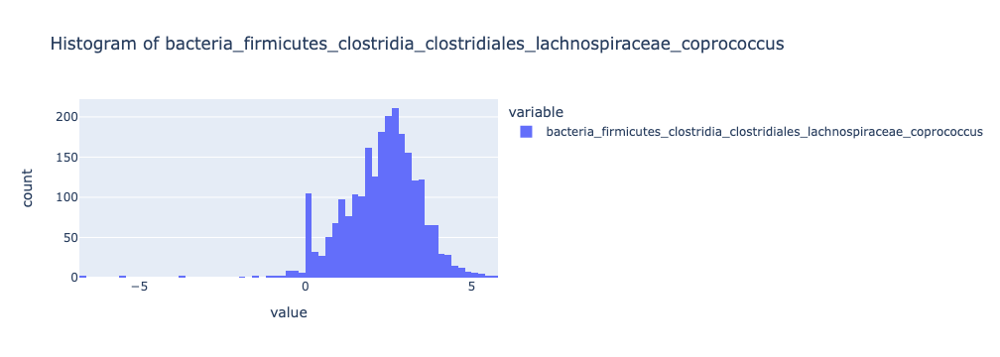

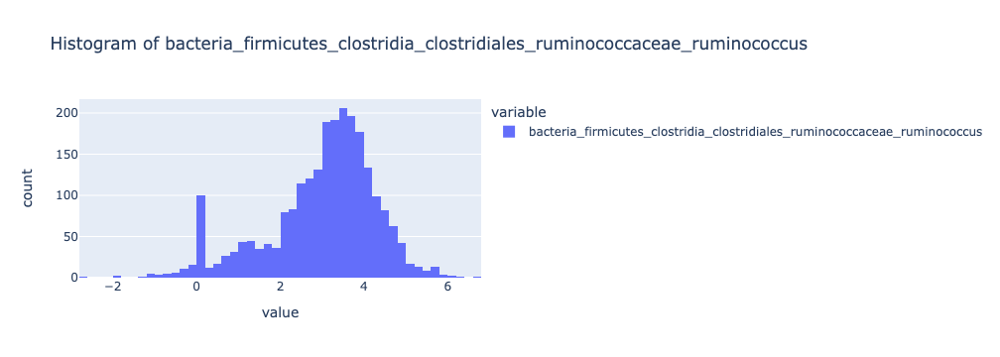

...

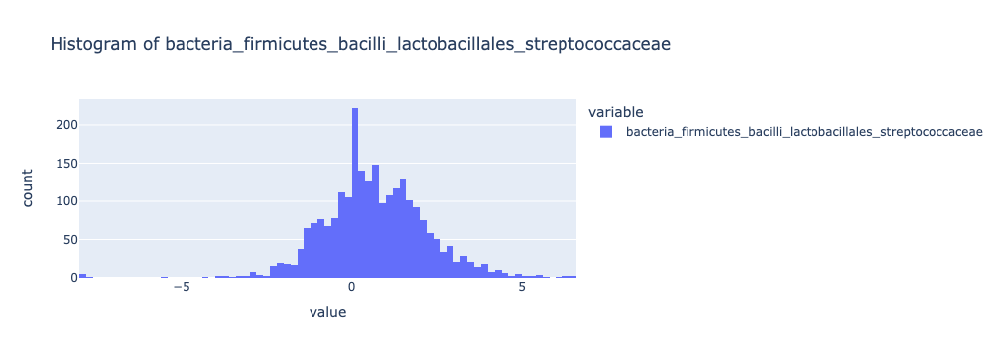

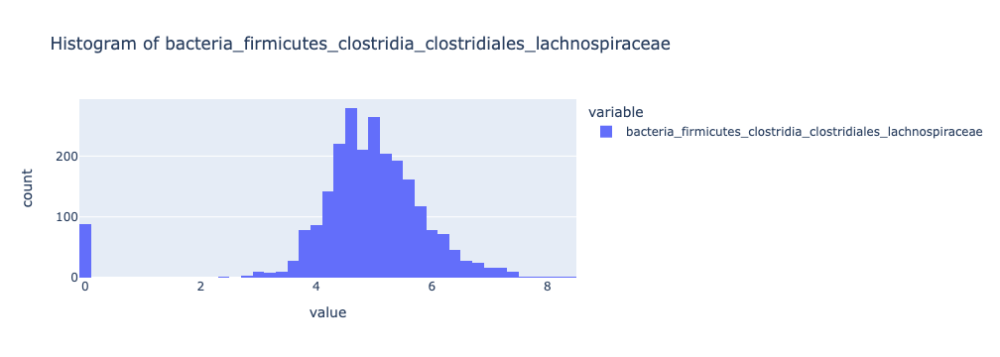

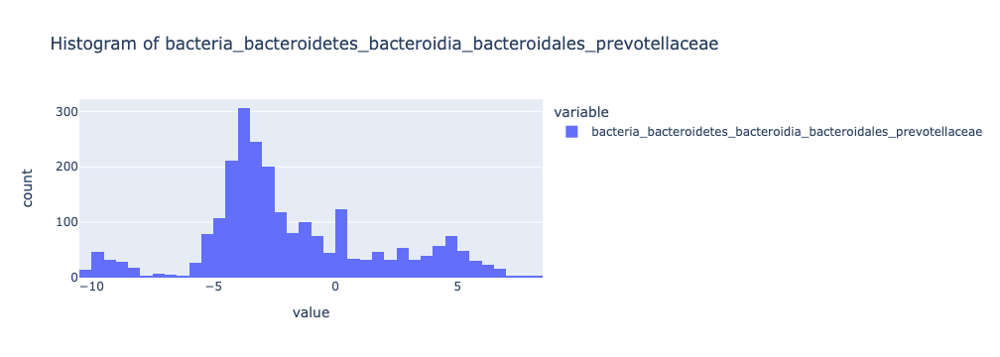

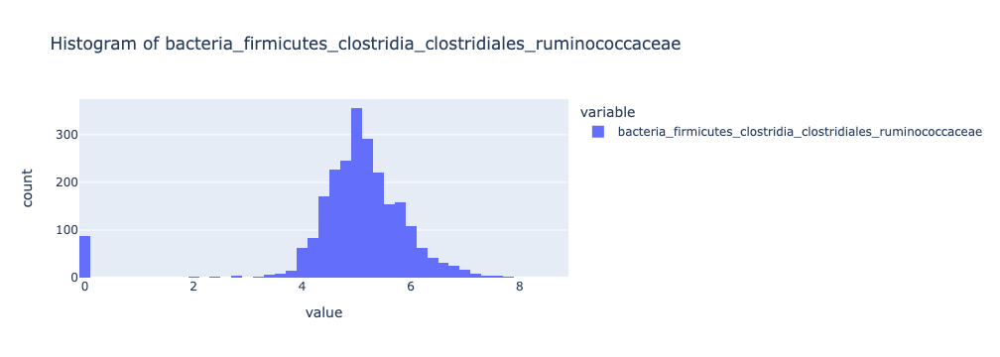

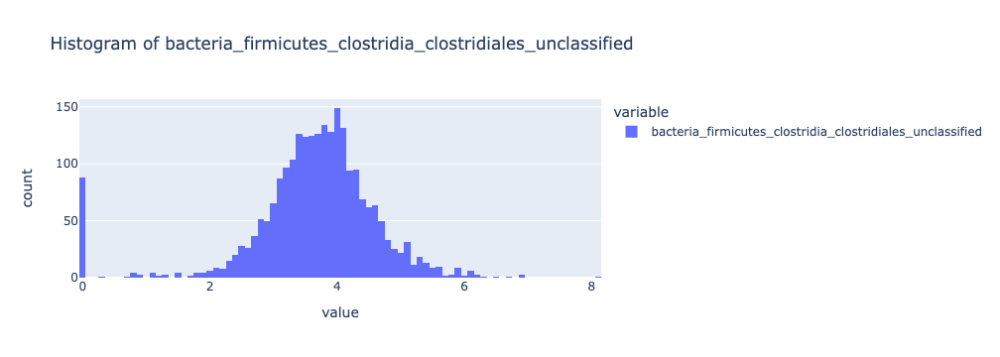

In [141]:
import plotly.express as px
for column in sleep_merged[microbe_features]:
    fig = px.histogram(sleep_merged[column], 
                     title=f'Histogram of {column}')
    fig.show()

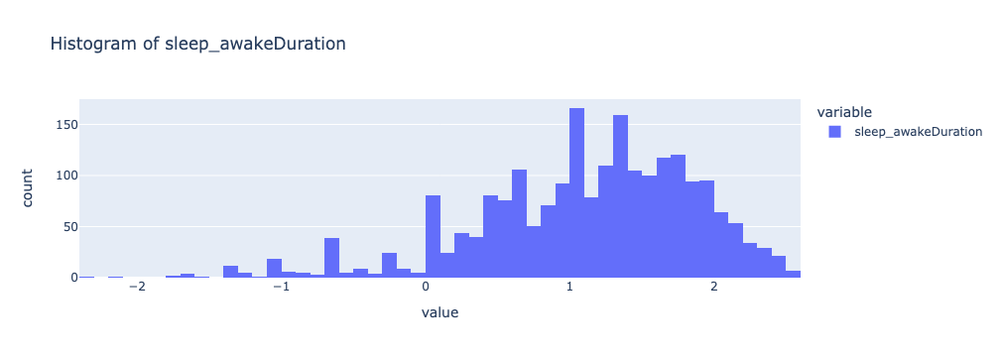

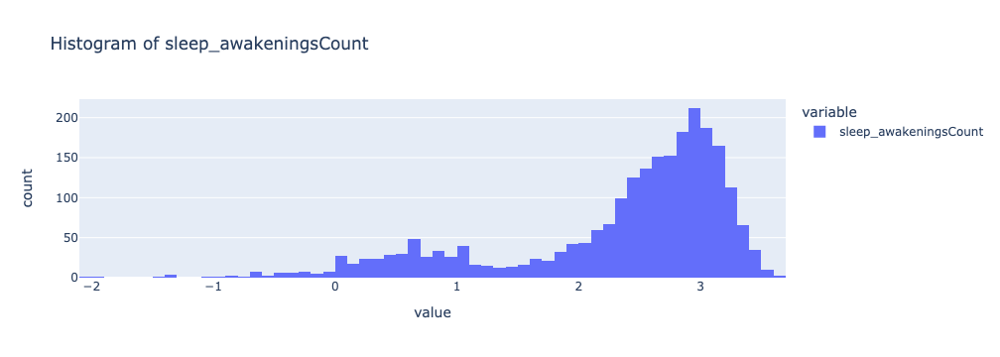

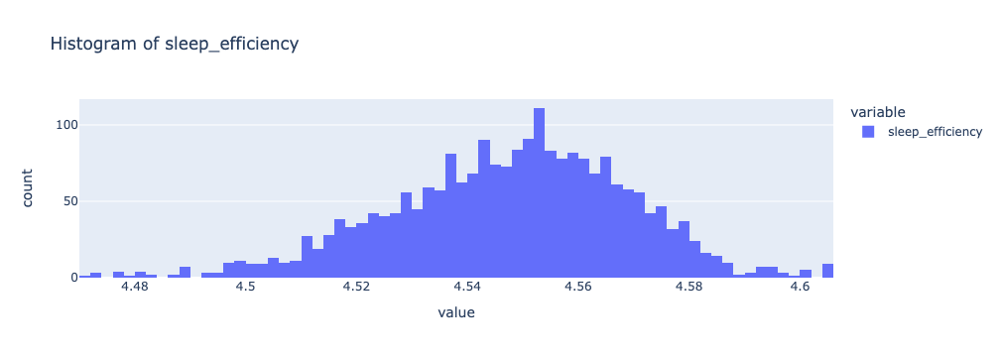

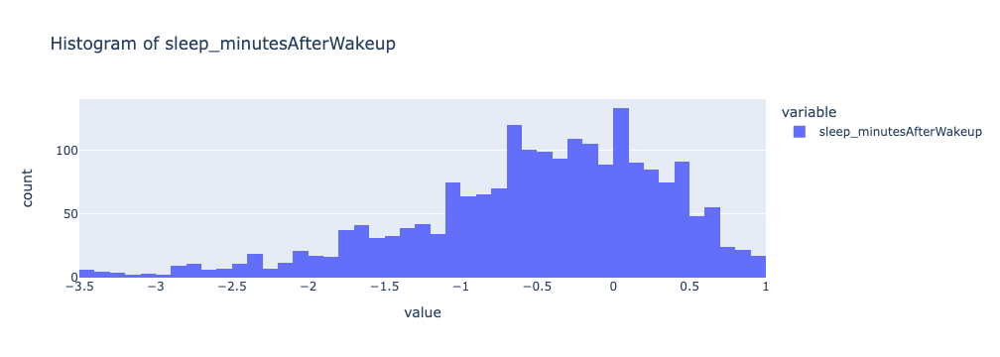

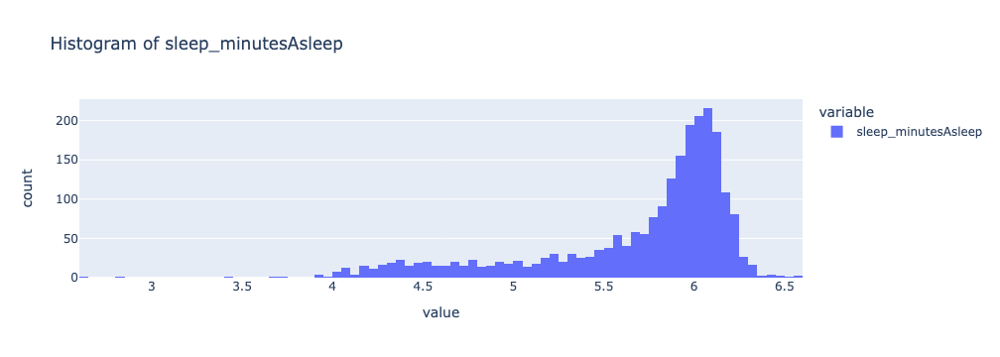

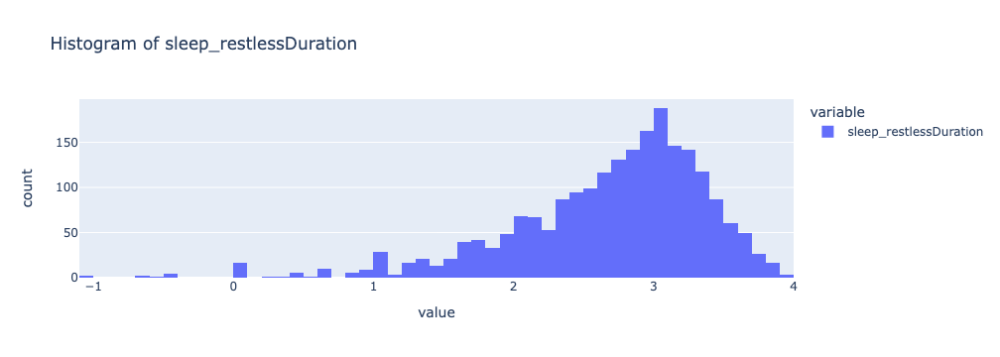

In [4]:
import plotly.express as px
for column in sleep_merged[sleep_features]:
    fig = px.histogram(sleep_merged[column], 
                     title=f'Histogram of {column}')
    fig.show()

In [34]:
#z-score standardize the columns
#sleep_merged[microbe_features] = sleep_merged[microbe_features].apply(lambda x: (x - x.mean()) / x.std())
#sleep_merged[sleep_features] = sleep_merged[sleep_features].apply(lambda x: (x - x.mean()) / x.std())

# Regression Microbes w/ sex, age, and BMI covariates 

In [36]:
from rich.progress import track
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import multipletests

def get_results(dependent_feature, independent_feature):
    """Get a single association for a specific combination of features."""
    # Define the formula using the provided dependent and independent variables
    formula = f"{dependent_feature} ~ C(sex) + age + BMI_CALC + C(vendor) + {independent_feature}"
    fitted = ols(formula, data=df).fit()
    
    # Create a Series with the results
    result_series = pd.Series({
        "dependent_feature": dependent_feature,
        "independent_feature": independent_feature,
        "beta": fitted.params[independent_feature],
        "t_statistic": fitted.tvalues[independent_feature],
        "p": fitted.pvalues[independent_feature],
        "n": fitted.nobs
    })

    return result_series

In [37]:
df = sleep_merged

# Define your lists of features
dependent_features = sleep_features
independent_features = microbe_features

# Initialize an empty list to store the results
all_results = []

# Iterate through all combinations of dependent and independent features
for dependent_feature in track(dependent_features, description="Dependent Features"):
    for independent_feature in independent_features:
        result = get_results(dependent_feature, independent_feature)
        all_results.append(result)

# turn the all_results list into a pandas df
tests = pd.DataFrame(pd.concat(all_results, axis=1))
tests = tests.transpose()
tests["q"] = multipletests(tests["p"], method="fdr_bh")[1]

In [7]:
tests

,dependent_feature,independent_feature,beta,t_statistic,p,n,q
0,sleep_awakeDuration,bacteria_firmicutes_bacilli_lactobacillales_st...,0.001594,0.146783,0.883317,2094.0,0.96666
1,sleep_awakeDuration,bacteria_firmicutes_clostridia_clostridiales_l...,0.032097,1.617814,0.105854,2094.0,0.296955
2,sleep_awakeDuration,bacteria_bacteroidetes_bacteroidia_bacteroidal...,0.000792,0.173227,0.862489,2094.0,0.958477
3,sleep_awakeDuration,bacteria_firmicutes_clostridia_clostridiales_l...,0.040592,2.68432,0.007325,2094.0,0.047495
4,sleep_awakeDuration,bacteria_firmicutes_clostridia_clostridiales_r...,-0.018047,-1.256045,0.20924,2094.0,0.447418
...,...,...,...,...,...,...,...
397,sleep_restlessDuration,bacteria_bacteroidetes_bacteroidia_bacteroidal...,0.003098,0.409657,0.682099,2101.0,0.833447
398,sleep_restlessDuration,bacteria_proteobacteria_betaproteobacteria_bur...,-0.003637,-0.662399,0.507788,2101.0,0.727985
399,sleep_restlessDuration,bacteria_firmicutes_clostridia_clostridiales_m...,-0.01199,-1.237359,0.216092,2101.0,0.452443
400,sleep_restlessDuration,bacteria_bacteroidetes_bacteroidia_bacteroidal...,-0.00892,-2.036677,0.041808,2101.0,0.161603


In [41]:
# save the results to a csv
tests.to_csv('sleep_and_microbes_regression_CLR_wZeroImpute3.csv', index=False)

# Regression Microbes w/ sex, age, BMI, and activity covariates 

In [42]:
from rich.progress import track
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import multipletests

def get_results(dependent_feature, independent_feature):
    """Get a single association for a specific combination of features."""
    # Define the formula using the provided dependent and independent variables
    activity_covariates = ' + '.join(activity_features)
    formula = f"{dependent_feature} ~ C(sex) + age + BMI_CALC + C(vendor) + {activity_covariates} + {independent_feature}"
    fitted = ols(formula, data=df).fit()
    
    # Create a Series with the results
    result_series = pd.Series({
        "dependent_feature": dependent_feature,
        "independent_feature": independent_feature,
        "beta": fitted.params[independent_feature],
        "t_statistic": fitted.tvalues[independent_feature],
        "p": fitted.pvalues[independent_feature],
        "n": fitted.nobs
    })

    return result_series

In [43]:
df = sleep_merged

# Define your lists of features
dependent_features = sleep_features
independent_features = microbe_features

# Initialize an empty list to store the results
all_results = []

# Iterate through all combinations of dependent and independent features
for dependent_feature in track(dependent_features, description="Dependent Features"):
    for independent_feature in independent_features:
        result = get_results(dependent_feature, independent_feature)
        all_results.append(result)

# turn the all_results list into a pandas df
tests = pd.DataFrame(pd.concat(all_results, axis=1))
tests = tests.transpose()
tests["q"] = multipletests(tests["p"], method="fdr_bh")[1]

In [11]:
tests

,dependent_feature,independent_feature,beta,t_statistic,p,n,q
0,sleep_awakeDuration,bacteria_firmicutes_bacilli_lactobacillales_st...,0.002039,0.190371,0.849037,2094.0,0.92761
1,sleep_awakeDuration,bacteria_firmicutes_clostridia_clostridiales_l...,0.026487,1.35492,0.17559,2094.0,0.446755
2,sleep_awakeDuration,bacteria_bacteroidetes_bacteroidia_bacteroidal...,0.00158,0.349778,0.726541,2094.0,0.887722
3,sleep_awakeDuration,bacteria_firmicutes_clostridia_clostridiales_l...,0.039607,2.645674,0.008214,2094.0,0.060039
4,sleep_awakeDuration,bacteria_firmicutes_clostridia_clostridiales_r...,-0.013014,-0.916955,0.359273,2094.0,0.614585
...,...,...,...,...,...,...,...
397,sleep_restlessDuration,bacteria_bacteroidetes_bacteroidia_bacteroidal...,0.003187,0.43401,0.664326,2101.0,0.869477
398,sleep_restlessDuration,bacteria_proteobacteria_betaproteobacteria_bur...,-0.002826,-0.529847,0.596274,2101.0,0.820898
399,sleep_restlessDuration,bacteria_firmicutes_clostridia_clostridiales_m...,-0.004767,-0.503308,0.614801,2101.0,0.832029
400,sleep_restlessDuration,bacteria_bacteroidetes_bacteroidia_bacteroidal...,-0.008897,-2.090429,0.0367,2101.0,0.152097


In [45]:
# save the results to a csv
tests.to_csv('sleep_and_microbes_regression_CLR_wZeroImpute_wActivityCovariates3.csv', index=False)

# Retained microbe hits after adding Activity covariates

In [3]:
import pandas as pd
import numpy as np

tests_woActivity = pd.read_csv('sleep_and_microbes_regression_CLR_wZeroImpute3.csv')
tests_woActivity = tests_woActivity[tests_woActivity.q < 0.05].sort_values(by='q')
tests_wActivity = pd.read_csv('sleep_and_microbes_regression_CLR_wZeroImpute_wActivityCovariates3.csv')
tests_wActivity = tests_wActivity[tests_wActivity.q < 0.05].sort_values(by='q')

In [4]:
common_rows = pd.merge(tests_woActivity, tests_wActivity, on=['independent_feature', 'dependent_feature'], how='inner')

## What microbes are associated with any sleep measure?

In [6]:
common_rows.independent_feature.value_counts()

independent_feature
bacteria_firmicutes_clostridia_clostridiales_clostridiaceae_clostridium                          4
bacteria_firmicutes_clostridia_clostridiales_lachnospiraceae_ruminococcus                        4
bacteria_firmicutes_clostridia_clostridiales_clostridiaceae                                      3
bacteria_firmicutes_erysipelotrichi_erysipelotrichales_erysipelotrichaceae                       3
bacteria_firmicutes_clostridia_clostridiales_lachnospiraceae_roseburia                           3
bacteria_firmicutes_clostridia_clostridiales_lachnospiraceae_coprococcus                         2
bacteria_actinobacteria_coriobacteriia_coriobacteriales_coriobacteriaceae_adlercreutzia          2
bacteria_actinobacteria_actinobacteria_actinomycetales_actinomycetaceae                          2
bacteria_actinobacteria_actinobacteria_actinomycetales_actinomycetaceae_actinomyces              2
bacteria_firmicutes_clostridia_clostridiales_peptostreptococcaceae_unclassified          

In [8]:
len(common_rows.independent_feature.value_counts().index.tolist())

21

## How many microbe-sleep hits after accounting for activity variables?

In [8]:
display(tests_woActivity.dependent_feature.value_counts())

dependent_feature
sleep_restlessDuration      18
sleep_awakeningsCount       17
sleep_minutesAsleep         16
sleep_efficiency             6
sleep_awakeDuration          5
sleep_minutesAfterWakeup     2
Name: count, dtype: int64

In [155]:
tests_wActivity.dependent_feature.value_counts()

dependent_feature
sleep_restlessDuration    16
sleep_minutesAsleep       14
sleep_awakeningsCount      8
sleep_awakeDuration        3
sleep_efficiency           2
Name: count, dtype: int64

In [154]:
common_rows.dependent_feature.value_counts()

dependent_feature
sleep_restlessDuration    14
sleep_minutesAsleep       13
sleep_awakeningsCount      8
sleep_awakeDuration        3
sleep_efficiency           2
Name: count, dtype: int64

## Only 2 hits for sleep_efficiency, let's investigate

In [19]:
common_rows_sleep_efficiency = common_rows[common_rows.dependent_feature == 'sleep_efficiency']

In [20]:
common_rows_sleep_efficiency

,dependent_feature,independent_feature,beta_x,t_statistic_x,p_x,n_x,q_x,beta_y,t_statistic_y,p_y,n_y,q_y
4,sleep_efficiency,bacteria_actinobacteria_coriobacteriia_corioba...,0.000805,5.088716,3.914494e-07,2178.0,0.000022,0.000776,4.888050,0.000001,2178.0,0.000063
39,sleep_efficiency,bacteria_firmicutes_erysipelotrichi_erysipelot...,-0.001157,-2.817599,4.882168e-03,2178.0,0.038483,-0.001164,-2.821944,0.004817,2178.0,0.045033


In [6]:
microbe_hits_sleep_efficiency = common_rows_sleep_efficiency.independent_feature.tolist()

In [7]:
microbe_hits_sleep_efficiency

['bacteria_actinobacteria_coriobacteriia_coriobacteriales_coriobacteriaceae_adlercreutzia',
 'bacteria_firmicutes_erysipelotrichi_erysipelotrichales_erysipelotrichaceae']

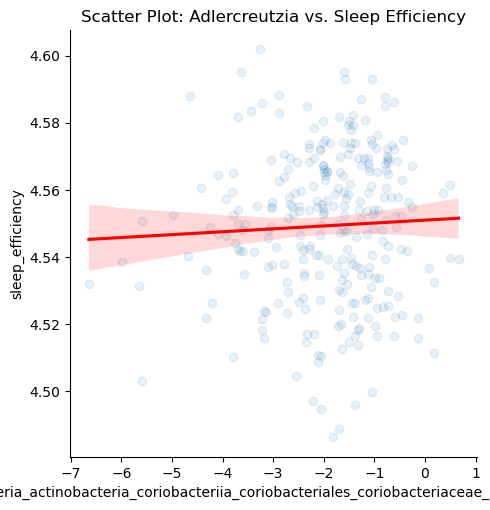

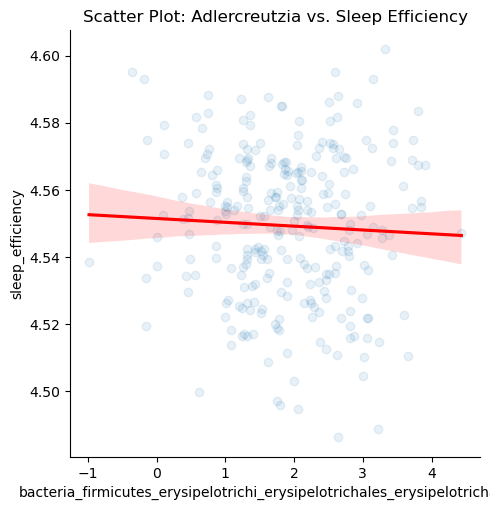

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame, and you want to plot each column against "sleep_efficiency"
for column in microbe_hits_sleep_efficiency:
    g = sns.lmplot(x=column, y="sleep_efficiency", data=sleep_merged, scatter_kws={'alpha':0.1}, ci=95, fit_reg=True, line_kws={'color': 'red'})
    plt.title(f'Scatter Plot: Adlercreutzia vs. Sleep Efficiency')
    plt.show()

## Is Adlercreutzia associated with other microbes that are also associated with sleep?

In [170]:
from rich.progress import track
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import multipletests

def get_results(dependent_feature, independent_feature):
    """Get a single association for a specific combination of features."""
    # Define the formula using the provided dependent and independent variables
    activity_covariates = ' + '.join(activity_features)
    formula = f"{dependent_feature} ~ C(sex) + age + BMI_CALC + C(vendor) + {activity_covariates} + {independent_feature}"
    fitted = ols(formula, data=df).fit()
    
    # Create a Series with the results
    result_series = pd.Series({
        "dependent_feature": dependent_feature,
        "independent_feature": independent_feature,
        "beta": fitted.params[independent_feature],
        "t_statistic": fitted.tvalues[independent_feature],
        "p": fitted.pvalues[independent_feature],
        "n": fitted.nobs
    })

    return result_series

In [171]:
df = sleep_merged

# Define your lists of features
dependent_features = microbe_features
independent_features = ['bacteria_actinobacteria_coriobacteriia_coriobacteriales_coriobacteriaceae_adlercreutzia']

# Initialize an empty list to store the results
all_results = []

# Iterate through all combinations of dependent and independent features
for dependent_feature in track(dependent_features, description="Dependent Features"):
    for independent_feature in independent_features:
        result = get_results(dependent_feature, independent_feature)
        all_results.append(result)

# turn the all_results list into a pandas df
tests = pd.DataFrame(pd.concat(all_results, axis=1))
tests = tests.transpose()
tests["q"] = multipletests(tests["p"], method="fdr_bh")[1]

In [178]:
tests[(tests.q < 0.05) & (tests.dependent_feature.isin(common_rows.independent_feature))].sort_values(by='q')

,dependent_feature,independent_feature,beta,t_statistic,p,n,q
39,bacteria_actinobacteria_coriobacteriia_corioba...,bacteria_actinobacteria_coriobacteriia_corioba...,1.0,5529477223229846.0,0.0,2317.0,0.0
55,bacteria_firmicutes_clostridia_clostridiales_v...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.109317,-12.142405,0.0,2317.0,0.0
44,bacteria_proteobacteria_gammaproteobacteria_en...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.223835,-9.356229,0.0,2317.0,0.0
5,bacteria_proteobacteria_gammaproteobacteria_en...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.223375,-9.048237,0.0,2317.0,0.0
50,bacteria_firmicutes_erysipelotrichi_erysipelot...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.060475,-7.631545,0.0,2317.0,0.0
45,bacteria_firmicutes_bacilli_lactobacillales_st...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.080876,-7.288181,0.0,2317.0,0.0
27,bacteria_firmicutes_clostridia_clostridiales_l...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.074468,-7.29252,0.0,2317.0,0.0
56,bacteria_firmicutes_clostridia_clostridiales_p...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.142921,-7.075146,0.0,2317.0,0.0
20,bacteria_actinobacteria_actinobacteria_actinom...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.106854,-6.667265,0.0,2317.0,0.0
17,bacteria_firmicutes_clostridia_clostridiales_l...,bacteria_actinobacteria_coriobacteriia_corioba...,-0.068291,-6.498481,0.0,2317.0,0.0


# Student's t-test, average Sleep Efficiency is higher w/ Adlercreutzia

In [101]:
no_adlercreutzia = sleep_merged.sleep_efficiency[sleep_merged.adlercreutzia_binary == 0]
yes_adlercreutzia = sleep_merged.sleep_efficiency[sleep_merged.adlercreutzia_binary == 1]

<Axes: >

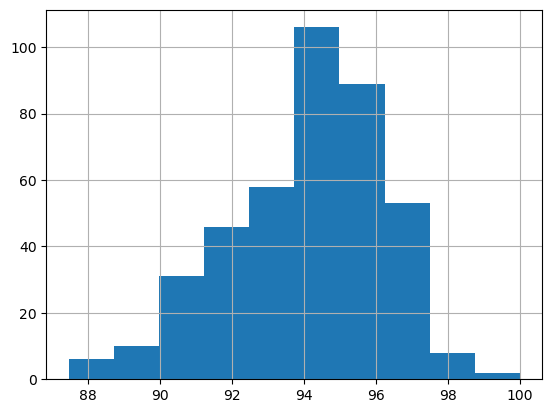

In [102]:
no_adlercreutzia.hist()

In [103]:
len(no_adlercreutzia)

432

In [104]:
np.var(no_adlercreutzia)

4.493156720675355

In [105]:
np.nanmean(no_adlercreutzia)

94.09340841766476

<Axes: >

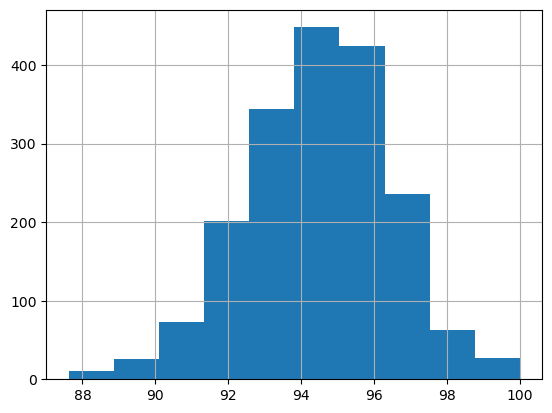

In [106]:
yes_adlercreutzia.hist()

In [107]:
len(yes_adlercreutzia)

1973

In [108]:
np.var(yes_adlercreutzia)

3.950418006807561

In [109]:
np.nanmean(yes_adlercreutzia)

94.48562400887934

In [157]:
from random import sample

sampled_yesAdler = sample(yes_adlercreutzia.tolist(), 429)

In [158]:
np.nanmean(sampled_yesAdler)

94.43418662898324

In [113]:
scipy.stats.ttest_ind(no_adlercreutzia, yes_adlercreutzia, alternative='less', equal_var=True, nan_policy='omit')

TtestResult(statistic=-3.566254546732755, pvalue=0.0001848236182543593, df=2259.0)

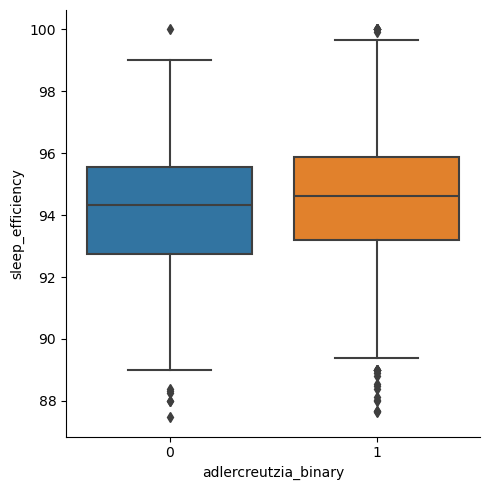

In [114]:
import seaborn as sns

sns.catplot(data=sleep_merged, x='adlercreutzia_binary', y='sleep_efficiency', kind='box')